In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier, BaggingClassifier, RandomForestClassifier, ExtraTreesClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
import pickle
import warnings
warnings.filterwarnings('ignore')

In [2]:
Insurance_df = pd.read_csv('Insurance.csv')
Insurance_df

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,...,?,87200,17440,8720,61040,Honda,Accord,2006,N,NaN
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,...,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N,NaN
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,...,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N,NaN
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,...,YES,46980,5220,5220,36540,Audi,A5,1998,N,NaN


In [3]:
Insurance_df.head()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN


In [4]:
Insurance_df.tail()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,...,?,87200,17440,8720,61040,Honda,Accord,2006,N,NaN
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,...,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N,NaN
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,...,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N,NaN
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,...,YES,46980,5220,5220,36540,Audi,A5,1998,N,NaN
999,456,60,556080,11-11-1996,OH,250/500,1000,766.19,0,612260,...,?,5060,460,920,3680,Mercedes,E400,2007,N,NaN


In [5]:
Insurance_df.isnull().sum()

months_as_customer                0
age                               0
policy_number                     0
policy_bind_date                  0
policy_state                      0
policy_csl                        0
policy_deductable                 0
policy_annual_premium             0
umbrella_limit                    0
insured_zip                       0
insured_sex                       0
insured_education_level           0
insured_occupation                0
insured_hobbies                   0
insured_relationship              0
capital-gains                     0
capital-loss                      0
incident_date                     0
incident_type                     0
collision_type                    0
incident_severity                 0
authorities_contacted             0
incident_state                    0
incident_city                     0
incident_location                 0
incident_hour_of_the_day          0
number_of_vehicles_involved       0
property_damage             

In [6]:
Insurance_df.dtypes

months_as_customer               int64
age                              int64
policy_number                    int64
policy_bind_date                object
policy_state                    object
policy_csl                      object
policy_deductable                int64
policy_annual_premium          float64
umbrella_limit                   int64
insured_zip                      int64
insured_sex                     object
insured_education_level         object
insured_occupation              object
insured_hobbies                 object
insured_relationship            object
capital-gains                    int64
capital-loss                     int64
incident_date                   object
incident_type                   object
collision_type                  object
incident_severity               object
authorities_contacted           object
incident_state                  object
incident_city                   object
incident_location               object
incident_hour_of_the_day 

In [7]:
Insurance_df['policy_bind_date'].unique()

array(['17-10-2014', '27-06-2006', '06-09-2000', '25-05-1990',
       '06-06-2014', '12-10-2006', '04-06-2000', '03-02-1990',
       '05-02-1997', '25-07-2011', '26-05-2002', '29-05-1999',
       '20-11-1997', '26-10-2012', '28-12-1998', '19-10-1992',
       '08-06-2005', '15-11-2004', '28-12-2014', '02-08-1992',
       '25-06-2002', '27-11-2005', '27-05-1994', '08-02-1991',
       '02-02-1996', '05-12-2013', '20-09-1990', '18-07-2002',
       '08-02-1990', '04-03-2014', '18-02-2000', '19-06-2008',
       '01-08-2003', '04-04-1992', '13-01-1991', '08-08-2010',
       '09-03-2003', '03-02-1993', '25-11-2002', '27-07-1997',
       '08-05-1995', '30-08-2012', '30-04-2006', '13-04-2003',
       '05-12-2007', '21-08-2006', '08-01-1990', '18-03-1990',
       '07-01-2008', '10-03-1997', '10-01-2004', '20-08-1994',
       '02-06-2002', '28-04-1994', '17-08-2014', '11-08-2007',
       '20-11-2008', '18-10-1995', '19-05-1993', '26-02-2005',
       '14-02-1990', '30-09-1993', '10-06-2014', '28-10

In [8]:
Insurance_df['fraud_reported'].unique()

array(['Y', 'N'], dtype=object)

In [9]:
Insurance_df['policy_state'].unique()

array(['OH', 'IN', 'IL'], dtype=object)

In [10]:
Insurance_df['auto_make'].unique()

array(['Saab', 'Mercedes', 'Dodge', 'Chevrolet', 'Accura', 'Nissan',
       'Audi', 'Toyota', 'Ford', 'Suburu', 'BMW', 'Jeep', 'Honda',
       'Volkswagen'], dtype=object)

In [11]:
Insurance_df['police_report_available'].unique()

array(['YES', '?', 'NO'], dtype=object)

In [12]:
Insurance_df['property_damage'].unique()

array(['YES', '?', 'NO'], dtype=object)

In [13]:
Insurance_df['incident_date'].unique()

array(['25-01-2015', '21-01-2015', '22-02-2015', '10-01-2015',
       '17-02-2015', '02-01-2015', '13-01-2015', '27-02-2015',
       '30-01-2015', '05-01-2015', '06-01-2015', '15-02-2015',
       '22-01-2015', '08-01-2015', '15-01-2015', '29-01-2015',
       '19-01-2015', '01-01-2015', '10-02-2015', '11-01-2015',
       '24-02-2015', '09-01-2015', '28-01-2015', '07-01-2015',
       '18-01-2015', '28-02-2015', '12-02-2015', '24-01-2015',
       '03-01-2015', '16-01-2015', '14-02-2015', '21-02-2015',
       '18-02-2015', '26-02-2015', '17-01-2015', '27-01-2015',
       '11-02-2015', '12-01-2015', '06-02-2015', '20-01-2015',
       '02-02-2015', '20-02-2015', '08-02-2015', '23-02-2015',
       '01-03-2015', '14-01-2015', '19-02-2015', '09-02-2015',
       '26-01-2015', '23-01-2015', '31-01-2015', '03-02-2015',
       '01-02-2015', '05-02-2015', '25-02-2015', '16-02-2015',
       '13-02-2015', '04-02-2015', '07-02-2015', '04-01-2015'],
      dtype=object)

In [14]:
Insurance_df.drop(['_c39'],axis=1,inplace=True)

In [15]:
Insurance_df.drop(['policy_bind_date'],axis=1,inplace=True)

In [16]:
Insurance_df['collision_type'] = Insurance_df['collision_type'].replace({'?':np.nan})
Insurance_df['property_damage'] = Insurance_df['property_damage'].replace({"?":np.nan})
Insurance_df['police_report_available'] = Insurance_df['police_report_available'].replace({"?":np.nan})


In [17]:
label_encoders = {}
for column in Insurance_df.select_dtypes(include=['object']).columns:
        label_encoders[column] = LabelEncoder()
        Insurance_df[column] = label_encoders[column].fit_transform(Insurance_df[column])


In [18]:
Insurance_df.dtypes

months_as_customer               int64
age                              int64
policy_number                    int64
policy_state                     int64
policy_csl                       int64
policy_deductable                int64
policy_annual_premium          float64
umbrella_limit                   int64
insured_zip                      int64
insured_sex                      int64
insured_education_level          int64
insured_occupation               int64
insured_hobbies                  int64
insured_relationship             int64
capital-gains                    int64
capital-loss                     int64
incident_date                    int64
incident_type                    int64
collision_type                   int64
incident_severity                int64
authorities_contacted            int64
incident_state                   int64
incident_city                    int64
incident_location                int64
incident_hour_of_the_day         int64
number_of_vehicles_involv

In [19]:
Insurance_df.isnull().sum()

months_as_customer             0
age                            0
policy_number                  0
policy_state                   0
policy_csl                     0
policy_deductable              0
policy_annual_premium          0
umbrella_limit                 0
insured_zip                    0
insured_sex                    0
insured_education_level        0
insured_occupation             0
insured_hobbies                0
insured_relationship           0
capital-gains                  0
capital-loss                   0
incident_date                  0
incident_type                  0
collision_type                 0
incident_severity              0
authorities_contacted          0
incident_state                 0
incident_city                  0
incident_location              0
incident_hour_of_the_day       0
number_of_vehicles_involved    0
property_damage                0
bodily_injuries                0
witnesses                      0
police_report_available        0
total_clai

<Axes: >

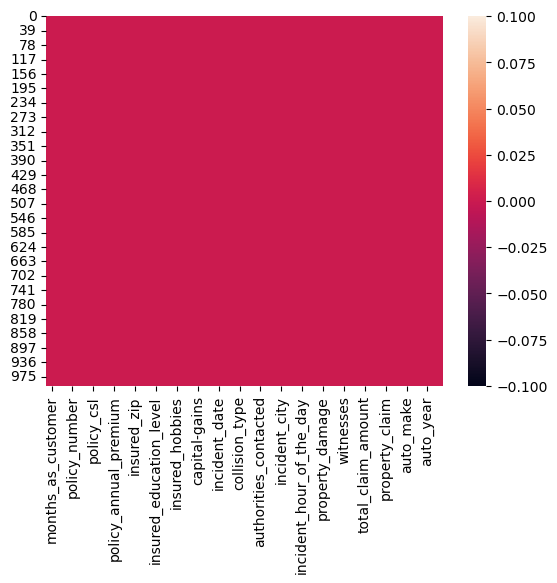

In [20]:
sns.heatmap(Insurance_df.isnull())

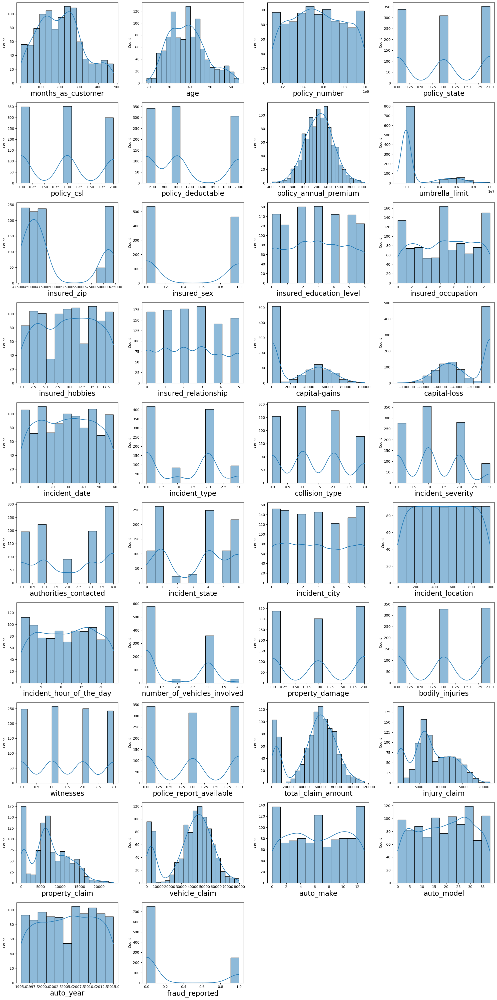

In [21]:
plt.figure(figsize = (20,40), facecolor = 'white')
plotnumber = 1

for column in Insurance_df:
    if plotnumber<=40:
        ax = plt.subplot(10,4,plotnumber)
        sns.histplot(Insurance_df[column],kde=True)
        plt.xlabel(column,fontsize=20)
        
    plotnumber+=1
plt.tight_layout()

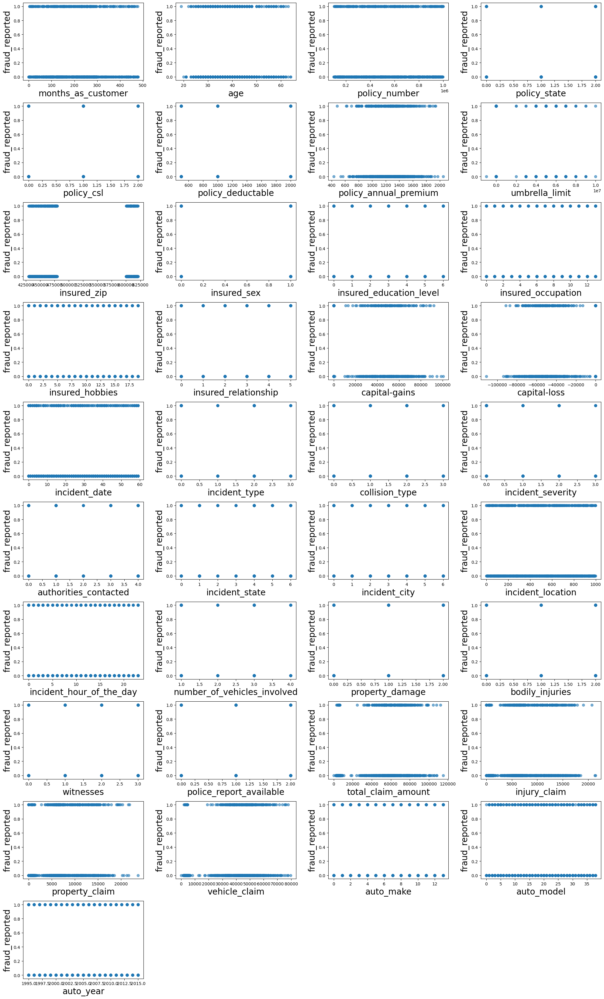

In [22]:
plt.figure(figsize=(20,33),facecolor='white')
plotnumber=1

for column in Insurance_df:
    if column != 'fraud_reported': 
            ax=plt.subplot(10,4,plotnumber)
            plt.scatter(Insurance_df[column], Insurance_df['fraud_reported'], alpha=0.6)
            plt.xlabel(column, fontsize=20)
            plt.ylabel('fraud_reported', fontsize=20)
            plotnumber += 1  

plt.tight_layout()
plt.show()


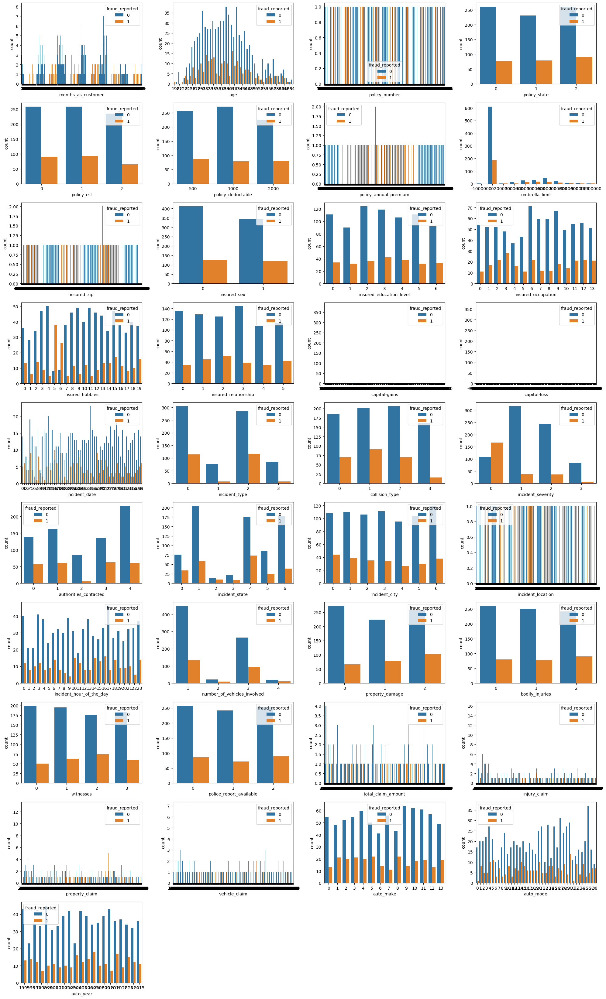

In [23]:
plt.figure(figsize=(20,33),facecolor='white')
plotnumber=1

for column in Insurance_df:
    if column != 'fraud_reported': 
            ax=plt.subplot(10,4,plotnumber)
            sns.countplot(x=Insurance_df[column],hue=Insurance_df['fraud_reported'])
            plt.xlabel(column)
            plotnumber += 1  

plt.tight_layout()
plt.show()

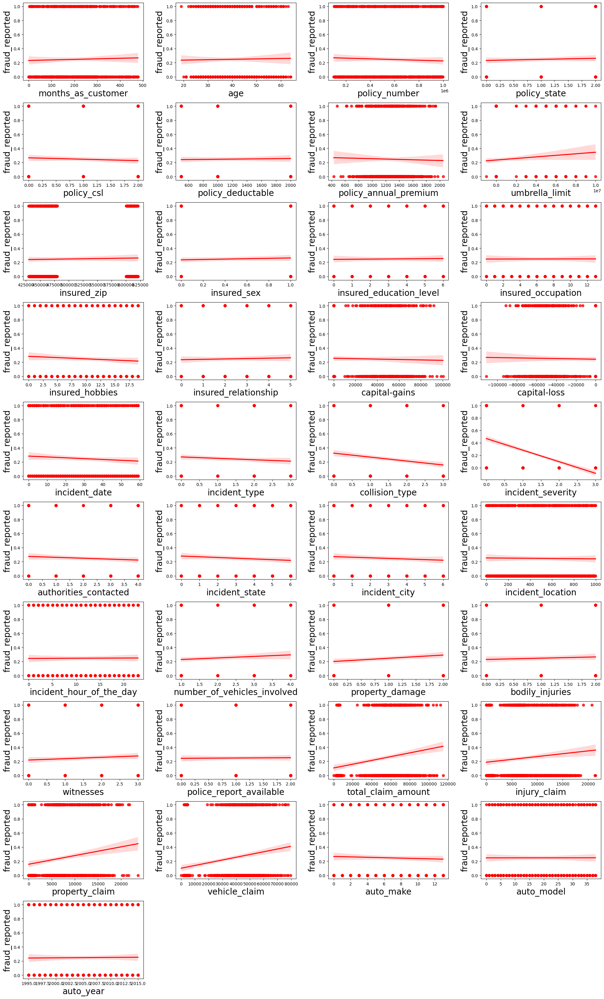

In [24]:
plt.figure(figsize=(20,33),facecolor='white')
plotnumber=1

for column in Insurance_df:
    if column != 'fraud_reported': 
            ax=plt.subplot(10,4,plotnumber)
            sns.regplot(x=Insurance_df[column],y=Insurance_df['fraud_reported'], color='r')
            plt.xlabel(column, fontsize=20)
            plt.ylabel('fraud_reported', fontsize=20)
            plotnumber += 1  

plt.tight_layout()
plt.show()

In [25]:
sns.pairplot(Insurance_df)

months_as_customer                Axes(0.125,0.814746;0.168478x0.0652542)
age                            Axes(0.327174,0.814746;0.168478x0.0652542)
policy_number                  Axes(0.529348,0.814746;0.168478x0.0652542)
policy_state                   Axes(0.731522,0.814746;0.168478x0.0652542)
policy_csl                        Axes(0.125,0.736441;0.168478x0.0652542)
policy_deductable              Axes(0.327174,0.736441;0.168478x0.0652542)
policy_annual_premium          Axes(0.529348,0.736441;0.168478x0.0652542)
umbrella_limit                 Axes(0.731522,0.736441;0.168478x0.0652542)
insured_zip                       Axes(0.125,0.658136;0.168478x0.0652542)
insured_sex                    Axes(0.327174,0.658136;0.168478x0.0652542)
insured_education_level        Axes(0.529348,0.658136;0.168478x0.0652542)
insured_occupation             Axes(0.731522,0.658136;0.168478x0.0652542)
insured_hobbies                   Axes(0.125,0.579831;0.168478x0.0652542)
insured_relationship           Axes(0.

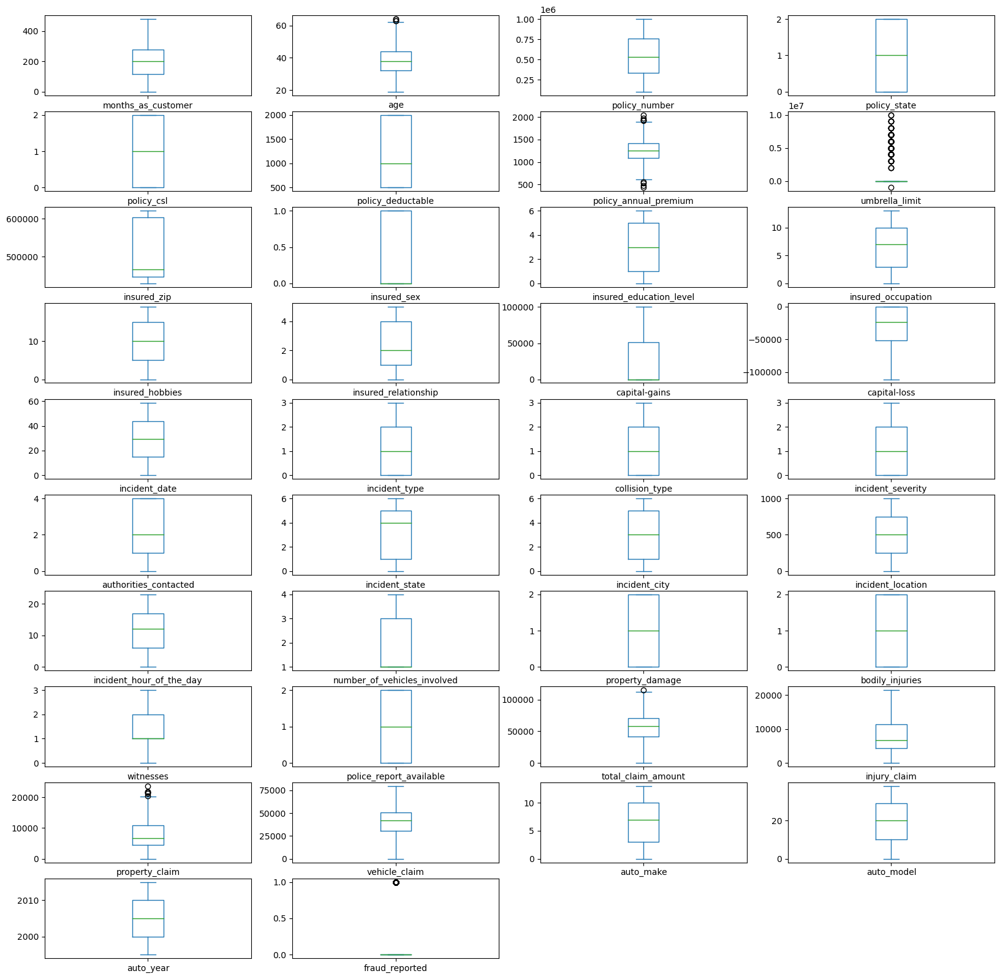

In [26]:
Insurance_df.plot(kind='box',subplots=True,layout=(10,4),figsize=(20,20))

In [27]:
from scipy.stats import zscore
out_liers=Insurance_df[['age','property_claim','policy_annual_premium','umbrella_limit','total_claim_amount']]
z=np.abs(zscore(out_liers))
z

,age,property_claim,policy_annual_premium,umbrella_limit,total_claim_amount
0,0.990836,1.165505,0.616705,0.479476,0.714257
1,0.334073,1.372696,0.242521,1.697980,1.807312
2,1.088913,0.736072,0.642233,1.697980,0.686362
3,0.224613,0.219722,0.652886,2.133471,0.403135
4,0.552994,1.399654,1.341980,2.133471,1.753121
...,...,...,...,...,...
995,0.103769,0.273817,0.222884,0.479476,1.305049
996,0.224613,2.214794,0.739141,0.479476,2.111466
997,0.541611,0.020826,0.520739,0.826998,0.558507
998,2.523284,0.451976,0.411866,1.697980,0.219110


In [28]:
np.where(z>3)

(array([ 31,  48,  88, 115, 119, 229, 248, 262, 314, 430, 458, 500, 503,
        657, 700, 763, 875, 922, 975]),
 array([3, 3, 3, 3, 3, 2, 2, 3, 3, 3, 3, 1, 3, 3, 3, 2, 3, 3, 3]))

In [29]:
data=Insurance_df[(z<3).all(axis=1)]
data.shape

(981, 38)

In [30]:
print("dataloss",((Insurance_df.shape[0]-data.shape[0])/Insurance_df.shape[0])*100)

dataloss 1.9


In [31]:
data.skew().sort_values(ascending=False)

umbrella_limit                 1.803065
fraud_reported                 1.189838
insured_zip                    0.838685
number_of_vehicles_involved    0.506989
age                            0.475942
policy_deductable              0.473431
capital-gains                  0.465985
months_as_customer             0.363268
property_claim                 0.358919
incident_severity              0.278443
injury_claim                   0.269442
insured_sex                    0.141238
collision_type                 0.130043
policy_csl                     0.098092
incident_type                  0.092461
insured_relationship           0.076242
incident_city                  0.042537
policy_number                  0.038201
policy_annual_premium          0.034884
witnesses                      0.024567
police_report_available        0.007599
insured_education_level        0.006225
incident_date                  0.003842
bodily_injuries                0.001877
incident_location             -0.002655


In [32]:
data.describe()

,months_as_customer,age,policy_number,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
count,981.000000,981.000000,981.000000,981.000000,981.000000,981.000000,981.000000,9.810000e+02,981.000000,981.000000,...,981.000000,981.000000,981.000000,981.000000,981.000000,981.000000,981.000000,981.000000,981.000000,981.000000
mean,204.594292,38.972477,545930.544343,1.020387,0.945973,1138.124363,1257.298359,9.908257e+05,500596.322120,0.464832,...,1.483180,0.995923,52714.525994,7431.213048,7391.182467,37892.130479,6.563710,19.235474,2005.123344,0.244648
std,115.362802,9.179406,257515.314276,0.830289,0.804412,611.567198,241.462236,2.120098e+06,71369.824051,0.499016,...,1.112532,0.828069,26336.821731,4885.814228,4793.177084,18839.979463,4.030657,11.136290,6.019871,0.430098
min,0.000000,19.000000,100804.000000,0.000000,0.000000,500.000000,538.170000,-1.000000e+06,430104.000000,0.000000,...,0.000000,0.000000,100.000000,0.000000,0.000000,70.000000,0.000000,0.000000,1995.000000,0.000000
25%,116.000000,32.000000,335780.000000,0.000000,0.000000,500.000000,1088.340000,0.000000e+00,448436.000000,0.000000,...,0.000000,0.000000,41700.000000,4280.000000,4490.000000,30240.000000,3.000000,10.000000,2000.000000,0.000000
50%,200.000000,38.000000,533940.000000,1.000000,1.000000,1000.000000,1257.360000,0.000000e+00,466390.000000,0.000000,...,1.000000,1.000000,57900.000000,6770.000000,6750.000000,42080.000000,7.000000,20.000000,2005.000000,0.000000
75%,278.000000,44.000000,760179.000000,2.000000,2.000000,2000.000000,1415.740000,0.000000e+00,602942.000000,1.000000,...,2.000000,2.000000,70500.000000,11280.000000,10860.000000,50720.000000,10.000000,29.000000,2010.000000,0.000000
max,479.000000,64.000000,999435.000000,2.000000,2.000000,2000.000000,1969.630000,7.000000e+06,620962.000000,1.000000,...,3.000000,2.000000,114920.000000,21450.000000,21810.000000,79560.000000,13.000000,38.000000,2015.000000,1.000000


In [33]:
data.corr()

,months_as_customer,age,policy_number,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
months_as_customer,1.000000,0.922960,0.061414,-0.007179,-0.021865,0.030777,-0.003875,0.018288,0.029708,0.059770,...,0.063289,-0.077065,0.058609,0.064864,0.036471,0.055831,0.049912,0.005350,0.001145,0.021375
age,0.922960,1.000000,0.062414,-0.020009,-0.013330,0.031851,0.005290,0.013305,0.035946,0.073857,...,0.056159,-0.068613,0.067703,0.077002,0.062231,0.058842,0.033873,0.015456,0.005767,0.013338
policy_number,0.061414,0.062414,1.000000,0.071324,0.042022,-0.011445,0.028229,0.000402,0.005578,0.008152,...,-0.007174,-0.017688,-0.017120,-0.007545,-0.012333,-0.018839,0.018083,0.066096,-0.003594,-0.036190
policy_state,-0.007179,-0.020009,0.071324,1.000000,0.001651,0.017559,0.015079,-0.010908,0.020683,-0.017970,...,0.025779,-0.031046,-0.014708,-0.048189,-0.006442,-0.006425,0.010283,-0.017956,-0.001116,0.034595
policy_csl,-0.021865,-0.013330,0.042022,0.001651,1.000000,0.009999,0.032677,0.013471,0.005529,-0.003467,...,0.071387,-0.004927,-0.054056,-0.079989,-0.042783,-0.043937,-0.009480,0.042770,-0.030441,-0.032542
policy_deductable,0.030777,0.031851,-0.011445,0.017559,0.009999,1.000000,-0.007754,0.012783,-0.005687,-0.008308,...,0.073531,0.003128,0.024955,0.039835,0.072395,0.006137,-0.029963,-0.004556,0.028073,0.014936
policy_annual_premium,-0.003875,0.005290,0.028229,0.015079,0.032677,-0.007754,1.000000,-0.014282,0.047286,0.040936,...,0.003949,0.009595,0.000082,-0.023726,-0.013674,0.009747,0.008776,-0.038708,-0.043022,-0.012900
umbrella_limit,0.018288,0.013305,0.000402,-0.010908,0.013471,0.012783,-0.014282,1.000000,0.004908,0.018503,...,-0.002012,0.009860,-0.047710,-0.046745,-0.021855,-0.049012,0.013502,0.015996,0.028712,0.044988
insured_zip,0.029708,0.035946,0.005578,0.020683,0.005529,-0.005687,0.047286,0.004908,1.000000,-0.037198,...,0.014868,0.055088,-0.036066,-0.020359,-0.008837,-0.042890,-0.019223,0.023084,-0.039671,0.010215
insured_sex,0.059770,0.073857,0.008152,-0.017970,-0.003467,-0.008308,0.040936,0.018503,-0.037198,1.000000,...,0.037991,-0.022572,-0.017024,0.007515,-0.009709,-0.023277,0.021281,-0.017329,-0.031674,0.021111


In [34]:
x = data.drop(['fraud_reported'], axis =1)
y = data['fraud_reported']

In [35]:
scaler = StandardScaler()
x = pd.DataFrame(scaler.fit_transform(x), columns = x.columns)

In [36]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values,i)
                        for i in range(len(x.columns))]
vif["Features"] = x.columns

vif

,VIF values,Features
0,6.903484,months_as_customer
1,6.909861,age
2,1.029563,policy_number
3,1.034059,policy_state
4,1.033959,policy_csl
5,1.038013,policy_deductable
6,1.032087,policy_annual_premium
7,1.031751,umbrella_limit
8,1.042598,insured_zip
9,1.025720,insured_sex


In [37]:
x_train, x_test, y_train, y_test = train_test_split(x, y,test_size=.30,random_state=65)
print('Training size:',x_train.shape)
print('Training target size:',y_train.shape)
print('Test size:',x_test.shape)
print('Test target size:',y_test.shape)

Training size: (686, 37)
Training target size: (686,)
Test size: (295, 37)
Test target size: (295,)


In [38]:
models = {
    "LogisticRegression": LogisticRegression(),
    "RandomForestClassifier": RandomForestClassifier(),
    "ExtraTreesClassifier": ExtraTreesClassifier(),
    "SVC": SVC(),
    "GradientBoostingClassifier": GradientBoostingClassifier(),
    "AdaBoostClassifier": AdaBoostClassifier(),
    "BaggingClassifier": BaggingClassifier(),
    "DecisionTreeClassifier":DecisionTreeClassifier()
}

In [39]:
for model_name, model in models.items():
    model.fit(x_train, y_train)
    y_pred = model.predict(x_test)
    print(f"{model_name} accuracy: {accuracy_score(y_test, y_pred)}")
    print(confusion_matrix(y_test, y_pred))
    print(classification_report(y_test, y_pred))

LogisticRegression accuracy: 0.7762711864406779
[[202  32]
 [ 34  27]]
              precision    recall  f1-score   support

           0       0.86      0.86      0.86       234
           1       0.46      0.44      0.45        61

    accuracy                           0.78       295
   macro avg       0.66      0.65      0.65       295
weighted avg       0.77      0.78      0.77       295

RandomForestClassifier accuracy: 0.8101694915254237
[[214  20]
 [ 36  25]]
              precision    recall  f1-score   support

           0       0.86      0.91      0.88       234
           1       0.56      0.41      0.47        61

    accuracy                           0.81       295
   macro avg       0.71      0.66      0.68       295
weighted avg       0.79      0.81      0.80       295

ExtraTreesClassifier accuracy: 0.7966101694915254
[[220  14]
 [ 46  15]]
              precision    recall  f1-score   support

           0       0.83      0.94      0.88       234
           1      

In [40]:
for model_name, model in models.items():
    cv_scores = cross_val_score(model, x, y, cv=5)
    print(f"{model_name} CV mean accuracy: {cv_scores.mean()*100:.2f}% ± {cv_scores.std()*100:.2f}%")

LogisticRegression CV mean accuracy: 78.18% ± 3.30%
RandomForestClassifier CV mean accuracy: 77.57% ± 1.58%
ExtraTreesClassifier CV mean accuracy: 76.76% ± 1.53%
SVC CV mean accuracy: 75.43% ± 1.38%
GradientBoostingClassifier CV mean accuracy: 83.90% ± 2.70%
AdaBoostClassifier CV mean accuracy: 79.61% ± 2.66%
BaggingClassifier CV mean accuracy: 84.10% ± 2.31%
DecisionTreeClassifier CV mean accuracy: 77.37% ± 1.66%


In [41]:
GB=GradientBoostingClassifier()

In [42]:
GB.fit(x_train,y_train)

GradientBoostingClassifier()

In [43]:
parameters={'learning_rate': [0.01,0.02,0.03],
                  'subsample'    : [0.9, 0.5, 0.2],
                  'n_estimators' : [100,500,1000],
                  'max_depth'    : [4,6,8] 
 
}

In [44]:
grid_GBC = GridSearchCV(GB, parameters,cv=2,n_jobs=-1)
grid_GBC.fit(x_train, y_train)

GridSearchCV(cv=2, estimator=GradientBoostingClassifier(), n_jobs=-1,
             param_grid={'learning_rate': [0.01, 0.02, 0.03],
                         'max_depth': [4, 6, 8],
                         'n_estimators': [100, 500, 1000],
                         'subsample': [0.9, 0.5, 0.2]})

In [45]:
filename="Insurance_Model.pkl"
pickle.dump(GB,open(filename,'wb'))
Final_Model=pickle.load(open(filename,'rb'))
result=Final_Model.score(x_test,y_test)
print(result)

0.8271186440677966
